In [1]:
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
# Create some data
rng = np.random.RandomState(0)
x = np.linspace(0, 10, 500)
y = np.cumsum(rng.randn(500, 6), 0)


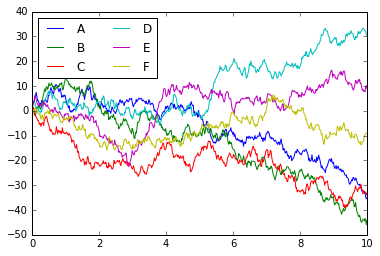

In [3]:
# Plot the data with Matplotlib defaults
plt.plot(x, y)
plt.legend('ABCDEF', ncol=2, loc='upper left');

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


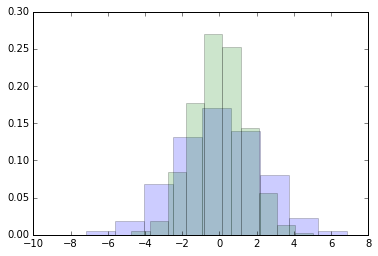

In [4]:
#Histograms, KDE, and densities
data = np.random.multivariate_normal([0, 0], [[5, 2], [2, 2]], size=2000)
data = pd.DataFrame(data, columns=['x', 'y'])
for col in 'xy':
    plt.hist(data[col], normed=True, alpha=0.2)

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


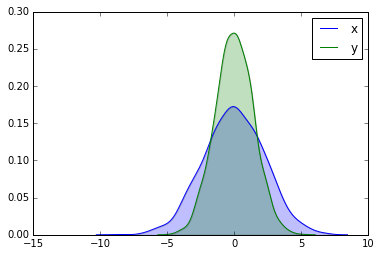

In [5]:
#Kernel Density Estimation
for col in 'xy':
     sns.kdeplot(data[col], shade=True)

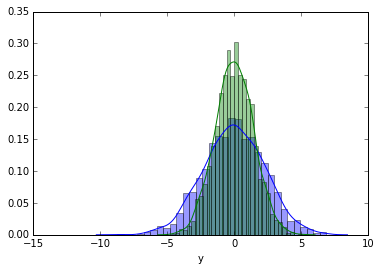

In [6]:
#Combining KDE and Histogram
sns.distplot(data['x'])
sns.distplot(data['y'])

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\distributions.py:679: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


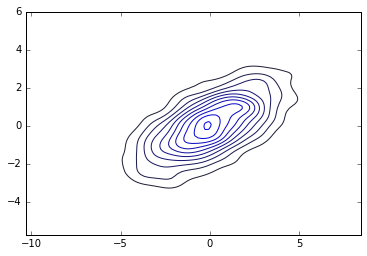

In [7]:
#the 2d datasets passed in kdeplot
sns.kdeplot(data);

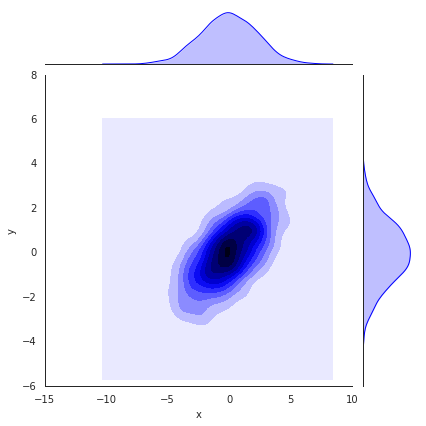

In [8]:
#joint distribution and the marginal distribution
#sns jointplot()
with sns.axes_style('white'):
    sns.jointplot("x", "y", data, kind='kde');

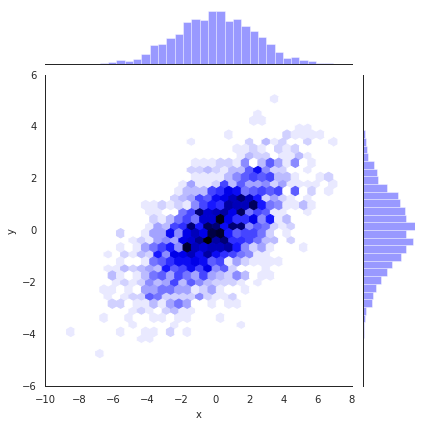

In [9]:
#pass other parameters
#hexagonall based histogram
with sns.axes_style('white'):
    sns.jointplot("x", "y", data, kind = 'hex')

In [10]:
#pair plots
#when joint plots to large datasets are generalized we end up with pair plots
#it useful for exploring correlations between multidimensional data, 
#when you'd like to plot all pairs of values against each other
iris = sns.load_dataset("iris")
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


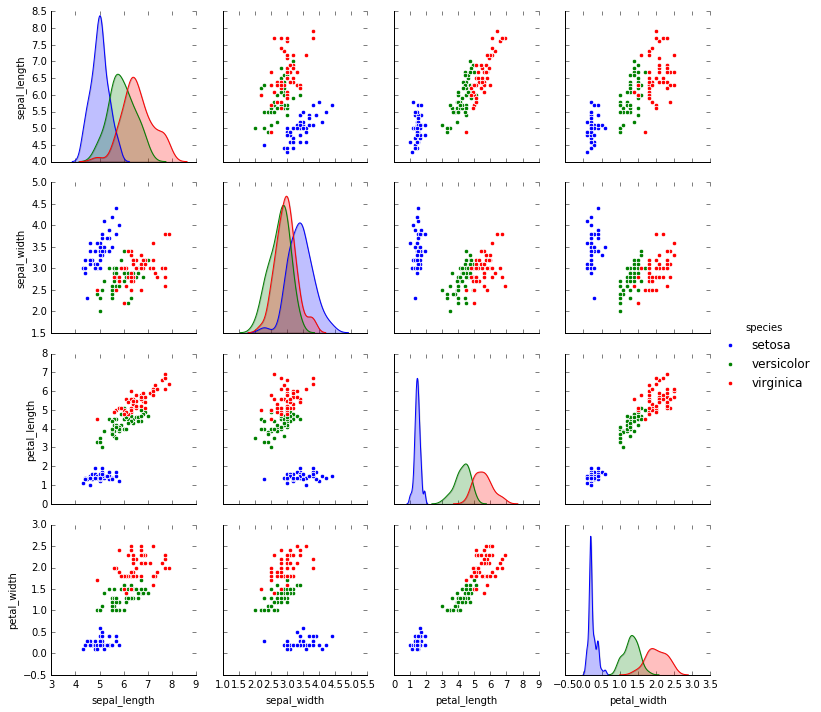

In [11]:
#sns.pairplot:
sns.pairplot(iris, hue="species", size=2.5);

In [12]:
#Faceted histograms
tips = sns.load_dataset('tips')
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


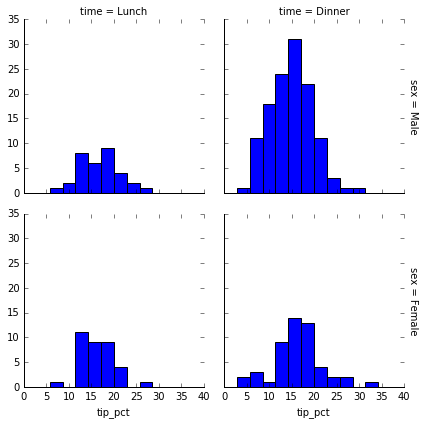

In [14]:
tips['tip_pct'] = 100 * tips['tip'] / tips['total_bill']
grid = sns.FacetGrid(tips, row="sex", col="time", margin_titles=True)
grid.map(plt.hist, "tip_pct", bins=np.linspace(0, 40, 15));

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


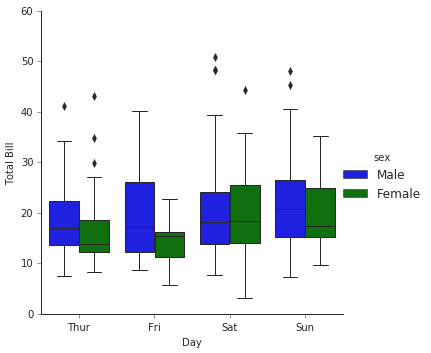

In [16]:
#Factor plots 
#This allows you to view the distribution of a parameter within bins defined by any other parameter:
with sns.axes_style(style='ticks'):
    g = sns.factorplot("day", "total_bill", "sex", data=tips, kind="box")
    g.set_axis_labels("Day", "Total Bill");

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


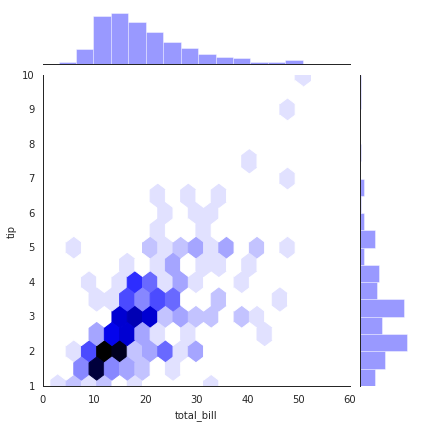

In [22]:
#Joint distribution
#joint distribution between different datasets, along with the associated marginal distributions:
with sns.axes_style('white'):
    sns.jointplot("total_bill", "tip", data=tips, kind='hex')

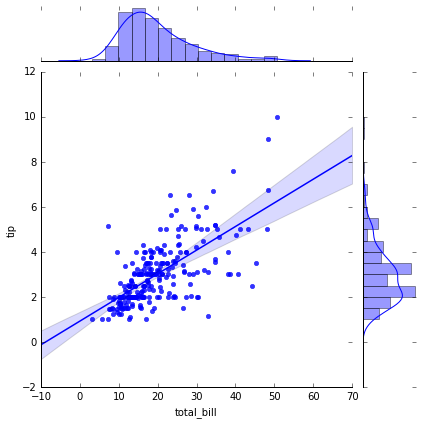

In [23]:
#Automatic kernel density estimation and regression with joint plots
sns.jointplot("total_bill", "tip", data=tips, kind='reg');


In [27]:
#bar plots
planets = sns.load_dataset('planets')
planets.head()

,method,number,orbital_period,mass,distance,year
0,Radial Velocity,1,269.300,7.10,77.40,2006
1,Radial Velocity,1,874.774,2.21,56.95,2008
2,Radial Velocity,1,763.000,2.60,19.84,2011
3,Radial Velocity,1,326.030,19.40,110.62,2007
4,Radial Velocity,1,516.220,10.50,119.47,2009


C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


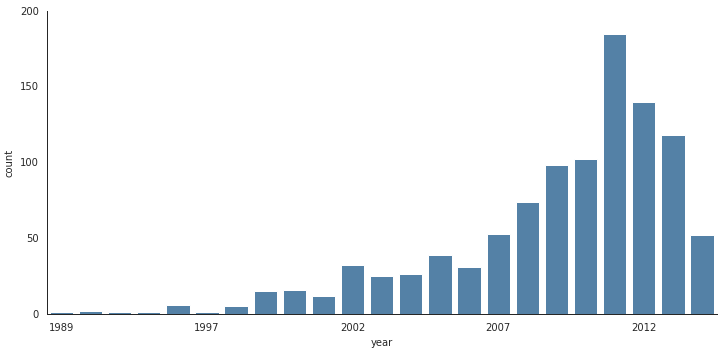

In [31]:
with sns.axes_style('white'):
    g = sns.factorplot("year", data=planets, aspect=2,
                      kind="count", color='steelblue')
    g.set_xticklabels(step=5)

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


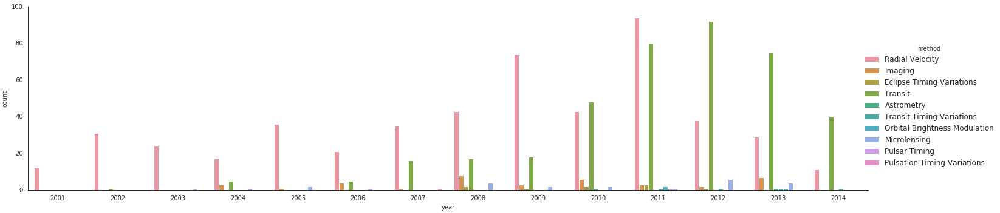

In [32]:
with sns.axes_style('white'):
    g = sns.factorplot("year", data=planets, aspect=4.0, kind='count',
                       hue='method', order=range(2001, 2015))

In [33]:
!curl -O https://raw.githubusercontent.com/jakevdp/marathon-data/master/marathon-data.csv

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0  836k    0  4676    0     0   1504      0  0:09:29  0:00:03  0:09:26  1504
  3  836k    3 31926    0     0   8768      0  0:01:37  0:00:03  0:01:34  8768
 17  836k   17  143k    0     0  32924      0  0:00:26  0:00:04  0:00:22 32924
 53  836k   53  447k    0     0  80518      0  0:00:10  0:00:05  0:00:05 87487
100  836k  100  836k    0     0   136k      0  0:00:06  0:00:06 --:--:--  197k


In [34]:
data = pd.read_csv('marathon-data.csv')
data.head()

,age,gender,split,final
0,33,M,01:05:38,02:08:51
1,32,M,01:06:26,02:09:28
2,31,M,01:06:49,02:10:42
3,38,M,01:06:16,02:13:45
4,31,M,01:06:32,02:13:59


In [35]:
data.dtypes

age        int64
gender    object
split     object
final     object
dtype: object

In [40]:
#convert to dtype timedelta64
def convert_time(s):
    h, m, s = map(int, s.split(':'))
    return pd.datetools.timedelta(hours=h, minutes=m, seconds=s)

data1 = pd.read_csv('marathon-data.csv',
                   converters={'split':convert_time, 'final':convert_time})
data1.head()

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: pandas.core.datetools.timedelta is deprecated. Please use datetime.timedelta instead.
  after removing the cwd from sys.path.
C:\Users\margaretm\AppData\Local\Continuum\anaconda3

,age,gender,split,final
0,33,M,01:05:38,02:08:51
1,32,M,01:06:26,02:09:28
2,31,M,01:06:49,02:10:42
3,38,M,01:06:16,02:13:45
4,31,M,01:06:32,02:13:59


In [41]:
data1.dtypes

age                 int64
gender             object
split     timedelta64[ns]
final     timedelta64[ns]
dtype: object